In [1]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


## Image_loader

In [0]:
def image_loader(image_name):
    image = Image.open(image_name)
    
    loader = transforms.Compose([
    transforms.Resize((512,512)),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor

    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

In [0]:
data_dir = "data/"
content_img = image_loader(data_dir+"geisel.jpg")
style_img = image_loader(data_dir+"14.jpg")

In [0]:
assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

## Image_displayer

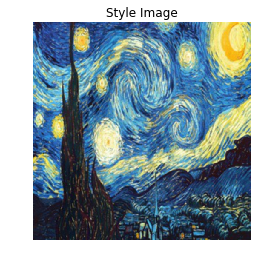

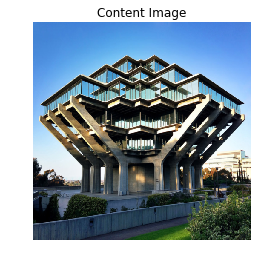

In [0]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()
def imshow(tensor, ax = plt , title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    ax.imshow(image)
    if title is not None:
      if ax == plt:
        ax.title(title)
      else:
        ax.title.set_text(title)
    ax.axis('off')

plt.figure()

imshow(style_img, title='Style Image')


plt.figure()

imshow(content_img, title='Content Image')

## Loss Function

### Content Loss

In [0]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input/2

### Style Loss

In [0]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    #inner product
    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [0]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input/4

## Import the model

In [0]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

In [0]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

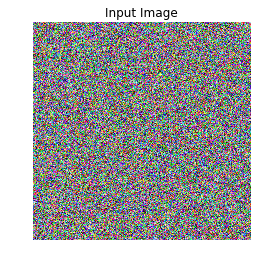

In [0]:
# desired depth layers to compute style/content losses :
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
content_layers_default = ['conv_4']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    print(content_layers)
    cnn = copy.deepcopy(cnn)

    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            #change MaxPoll to AvgPoll with the same parameters
            #layer = nn.AvgPool2d(kernel_size=2, stride=2, padding=0, ceil_mode=False)
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:      
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, style_losses, content_losses

## Gradient Decent

In [0]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

In [0]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1,content_layers=content_layers_default):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img,content_layers=content_layers)
    optimizer = get_input_optimizer(input_img)
    
    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            
            style_score = 0
            content_score = 0
            
            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
#             if run[0] % 50 == 0:
#                 print("run {}:".format(run))
#                 print('Style Loss : {:4f} Content Loss: {:4f}'.format(
#                     style_score.item(), content_score.item()))

            return loss

        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img


## Play with the weighting factors $\alpha/\beta$

Building the style transfer model..
['conv_1']
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.000173 Content Loss: 0.000011

run [100]:
Style Loss : 0.000173 Content Loss: 0.000000

run [150]:
Style Loss : 0.000173 Content Loss: 0.000000

run [200]:
Style Loss : 0.000173 Content Loss: 0.000000

run [250]:
Style Loss : 0.000173 Content Loss: 0.000000

run [300]:
Style Loss : 0.000173 Content Loss: 0.000000



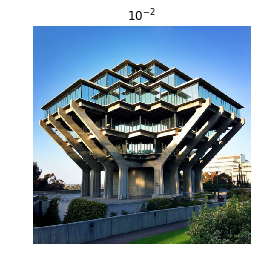

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.001679 Content Loss: 0.000039

run [100]:
Style Loss : 0.001679 Content Loss: 0.000028

run [150]:
Style Loss : 0.001679 Content Loss: 0.000028

run [200]:
Style Loss : 0.001679 Content Loss: 0.000028

run [250]:
Style Loss : 0.001679 Content Loss: 0.000028

run [300]:
Style Loss : 0.001679 Content Loss: 0.000028



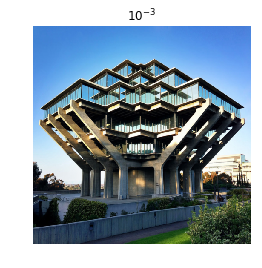

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.013020 Content Loss: 0.001966

run [100]:
Style Loss : 0.013029 Content Loss: 0.001945

run [150]:
Style Loss : 0.013029 Content Loss: 0.001945

run [200]:
Style Loss : 0.013029 Content Loss: 0.001945

run [250]:
Style Loss : 0.013029 Content Loss: 0.001945

run [300]:
Style Loss : 0.013029 Content Loss: 0.001945



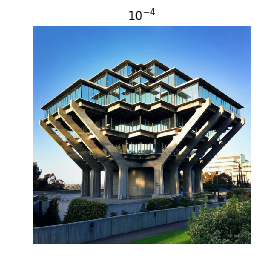

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.039206 Content Loss: 0.037220

run [100]:
Style Loss : 1.084154 Content Loss: 2.933203

run [150]:
Style Loss : 0.038241 Content Loss: 0.045815

run [200]:
Style Loss : 0.039266 Content Loss: 0.037517

run [250]:
Style Loss : 0.040307 Content Loss: 0.042849

run [300]:
Style Loss : 0.039290 Content Loss: 0.037502



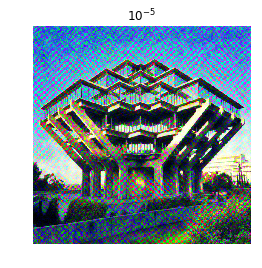

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.042658 Content Loss: 0.155110

run [100]:
Style Loss : 0.036012 Content Loss: 0.172844

run [150]:
Style Loss : 0.044902 Content Loss: 0.155842

run [200]:
Style Loss : 0.323072 Content Loss: 0.398045

run [250]:
Style Loss : 0.043500 Content Loss: 0.149076

run [300]:
Style Loss : 0.687122 Content Loss: 0.914332



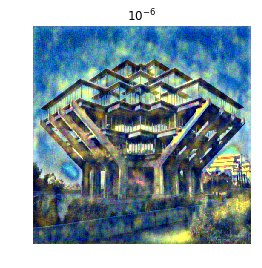

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.044689 Content Loss: 0.310212

run [100]:
Style Loss : 0.033645 Content Loss: 0.240781

run [150]:
Style Loss : 0.085399 Content Loss: 0.360822

run [200]:
Style Loss : 1728.311523 Content Loss: 9.505171

run [250]:
Style Loss : 3.455297 Content Loss: 1.759665

run [300]:
Style Loss : 0.472955 Content Loss: 0.320233



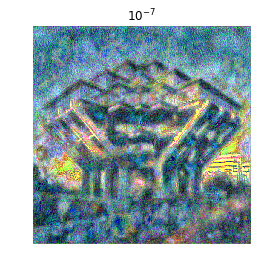

Building the style transfer model..
['conv_1']
Optimizing..
run [50]:
Style Loss : 0.119716 Content Loss: 1.133502

run [100]:
Style Loss : 0.050769 Content Loss: 0.603517

run [150]:
Style Loss : 8532.357422 Content Loss: 6.990431

run [200]:
Style Loss : 0.119552 Content Loss: 1.572500

run [250]:
Style Loss : 0.054374 Content Loss: 0.795949

run [300]:
Style Loss : 0.034823 Content Loss: 0.594235



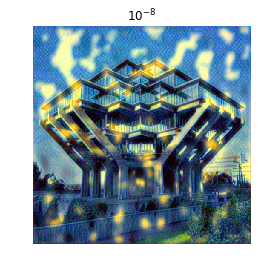

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.001853 Content Loss: 0.002475

run [100]:
Style Loss : 0.002067 Content Loss: 0.000391

run [150]:
Style Loss : 0.002088 Content Loss: 0.000256

run [200]:
Style Loss : 0.002072 Content Loss: 0.000250

run [250]:
Style Loss : 0.002068 Content Loss: 0.001770

run [300]:
Style Loss : 0.002075 Content Loss: 0.000241



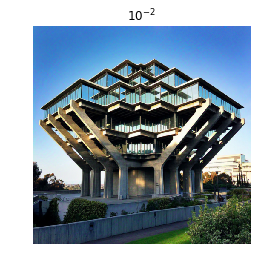

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.009306 Content Loss: 0.006731

run [100]:
Style Loss : 0.009350 Content Loss: 0.005168

run [150]:
Style Loss : 0.009326 Content Loss: 0.010478

run [200]:
Style Loss : 0.024155 Content Loss: 0.310880

run [250]:
Style Loss : 0.009407 Content Loss: 0.006528

run [300]:
Style Loss : 0.009620 Content Loss: 0.008131



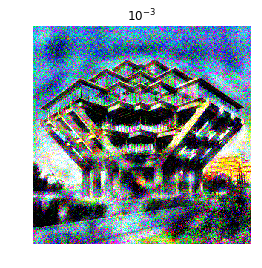

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.010240 Content Loss: 0.032088

run [100]:
Style Loss : 0.010259 Content Loss: 0.031254

run [150]:
Style Loss : 0.021685 Content Loss: 0.081989

run [200]:
Style Loss : 0.010329 Content Loss: 0.034596

run [250]:
Style Loss : 0.011233 Content Loss: 0.053583

run [300]:
Style Loss : 0.013411 Content Loss: 0.053786



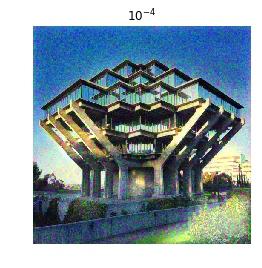

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.007512 Content Loss: 0.067086

run [100]:
Style Loss : 0.007515 Content Loss: 0.053432

run [150]:
Style Loss : 0.007520 Content Loss: 0.058554

run [200]:
Style Loss : 0.047995 Content Loss: 0.184055

run [250]:
Style Loss : 0.008418 Content Loss: 0.083774

run [300]:
Style Loss : 189.966644 Content Loss: 4.286912



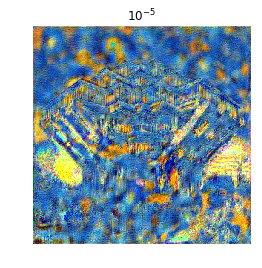

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.024711 Content Loss: 0.250196

run [100]:
Style Loss : 0.021056 Content Loss: 0.133175

run [150]:
Style Loss : 0.015251 Content Loss: 0.098210

run [200]:
Style Loss : 0.015826 Content Loss: 0.079836

run [250]:
Style Loss : 0.015267 Content Loss: 0.075621

run [300]:
Style Loss : 3358.825439 Content Loss: 5.307353



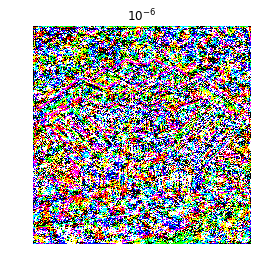

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.215648 Content Loss: 0.483016

run [100]:
Style Loss : 0.059796 Content Loss: 0.284654

run [150]:
Style Loss : 0.037436 Content Loss: 0.273466

run [200]:
Style Loss : 35004.320312 Content Loss: 5.558882

run [250]:
Style Loss : 124.650116 Content Loss: 0.898197

run [300]:
Style Loss : 0.091912 Content Loss: 0.600059



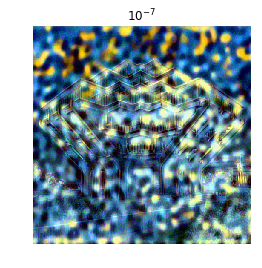

Building the style transfer model..
['conv_2']
Optimizing..
run [50]:
Style Loss : 0.878515 Content Loss: 0.737547

run [100]:
Style Loss : 0.121191 Content Loss: 0.584017

run [150]:
Style Loss : 0.071185 Content Loss: 0.450241

run [200]:
Style Loss : 528209.500000 Content Loss: 7.048500

run [250]:
Style Loss : 216627.234375 Content Loss: 4.651395

run [300]:
Style Loss : 1182.051147 Content Loss: 0.980558



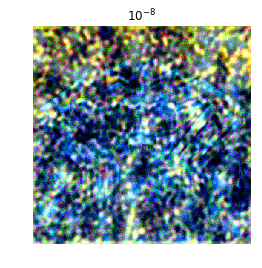

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.001004 Content Loss: 0.001717

run [100]:
Style Loss : 0.000792 Content Loss: 0.000946

run [150]:
Style Loss : 0.000757 Content Loss: 0.000753

run [200]:
Style Loss : 0.000735 Content Loss: 0.000810

run [250]:
Style Loss : 0.000733 Content Loss: 0.000662

run [300]:
Style Loss : 0.000756 Content Loss: 0.000830



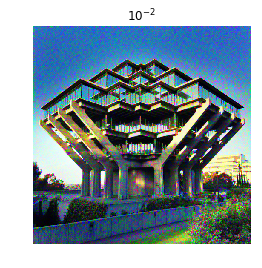

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.001704 Content Loss: 0.003918

run [100]:
Style Loss : 0.001191 Content Loss: 0.003113

run [150]:
Style Loss : 0.001187 Content Loss: 0.003745

run [200]:
Style Loss : 0.059210 Content Loss: 0.279703

run [250]:
Style Loss : 0.006343 Content Loss: 0.069695

run [300]:
Style Loss : 0.001540 Content Loss: 0.004272



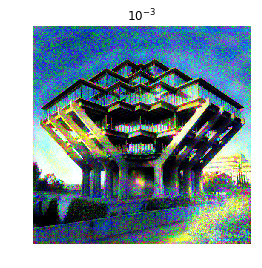

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.002310 Content Loss: 0.011169

run [100]:
Style Loss : 0.002331 Content Loss: 0.006855

run [150]:
Style Loss : 0.002303 Content Loss: 0.006229

run [200]:
Style Loss : 0.002412 Content Loss: 0.006348

run [250]:
Style Loss : 0.002630 Content Loss: 0.007240

run [300]:
Style Loss : 0.003083 Content Loss: 0.009071



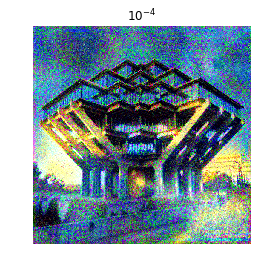

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.004197 Content Loss: 0.029373

run [100]:
Style Loss : 0.004775 Content Loss: 0.020114

run [150]:
Style Loss : 0.004541 Content Loss: 0.018377

run [200]:
Style Loss : 0.003886 Content Loss: 0.014306

run [250]:
Style Loss : 0.004390 Content Loss: 0.015228

run [300]:
Style Loss : 0.004208 Content Loss: 0.014408



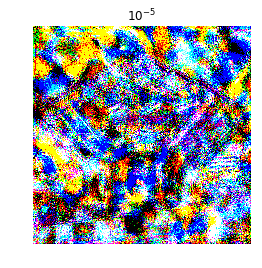

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.019124 Content Loss: 0.065190

run [100]:
Style Loss : 0.006831 Content Loss: 0.041039

run [150]:
Style Loss : 0.003958 Content Loss: 0.030532

run [200]:
Style Loss : 0.003917 Content Loss: 0.027800

run [250]:
Style Loss : 4856.297852 Content Loss: 2.048324

run [300]:
Style Loss : 40.053967 Content Loss: 0.142729



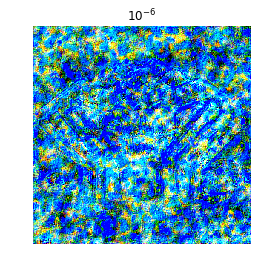

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.112175 Content Loss: 0.101977

run [100]:
Style Loss : 0.012653 Content Loss: 0.073666

run [150]:
Style Loss : 0.005974 Content Loss: 0.058727

run [200]:
Style Loss : 0.004350 Content Loss: 0.050422

run [250]:
Style Loss : 56749.457031 Content Loss: 2.001928

run [300]:
Style Loss : 37666.625000 Content Loss: 1.295040



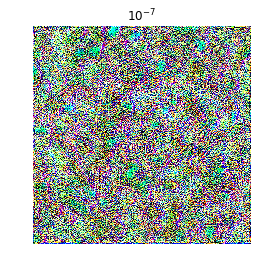

Building the style transfer model..
['conv_3']
Optimizing..
run [50]:
Style Loss : 0.975570 Content Loss: 0.109284

run [100]:
Style Loss : 0.087411 Content Loss: 0.105997

run [150]:
Style Loss : 0.029333 Content Loss: 0.094384

run [200]:
Style Loss : 0.015170 Content Loss: 0.085721

run [250]:
Style Loss : 0.009481 Content Loss: 0.077055

run [300]:
Style Loss : 0.007330 Content Loss: 0.070589



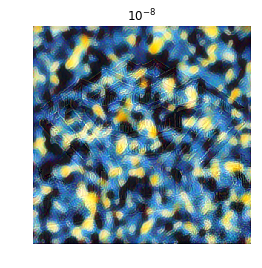

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.000654 Content Loss: 0.000665

run [100]:
Style Loss : 0.000166 Content Loss: 0.000362

run [150]:
Style Loss : 0.000110 Content Loss: 0.000292

run [200]:
Style Loss : 0.000098 Content Loss: 0.000261

run [250]:
Style Loss : 0.000091 Content Loss: 0.000248

run [300]:
Style Loss : 0.000108 Content Loss: 0.000612



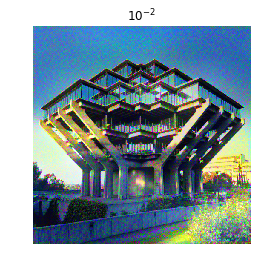

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.000424 Content Loss: 0.001601

run [100]:
Style Loss : 0.000258 Content Loss: 0.000835

run [150]:
Style Loss : 0.000258 Content Loss: 0.000657

run [200]:
Style Loss : 0.000237 Content Loss: 0.000552

run [250]:
Style Loss : 0.000222 Content Loss: 0.000466

run [300]:
Style Loss : 0.000445 Content Loss: 0.002953



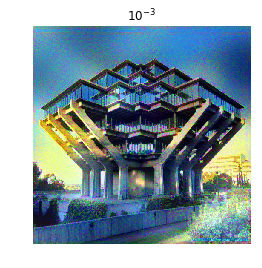

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.000665 Content Loss: 0.004341

run [100]:
Style Loss : 0.000576 Content Loss: 0.002292

run [150]:
Style Loss : 0.000528 Content Loss: 0.001386

run [200]:
Style Loss : 0.000549 Content Loss: 0.001208

run [250]:
Style Loss : 0.000501 Content Loss: 0.001115

run [300]:
Style Loss : 0.000722 Content Loss: 0.001670



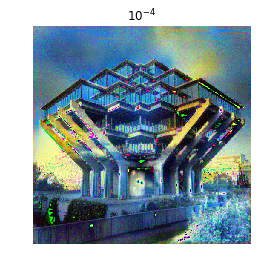

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.001992 Content Loss: 0.010586

run [100]:
Style Loss : 0.000702 Content Loss: 0.005336

run [150]:
Style Loss : 0.000646 Content Loss: 0.004052

run [200]:
Style Loss : 0.003805 Content Loss: 0.003897

run [250]:
Style Loss : 488.667572 Content Loss: 0.115495

run [300]:
Style Loss : 4.059330 Content Loss: 0.025133



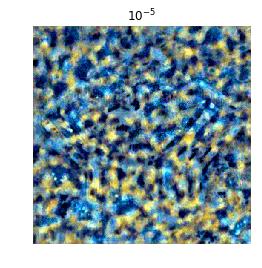

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.013932 Content Loss: 0.019650

run [100]:
Style Loss : 0.002163 Content Loss: 0.012220

run [150]:
Style Loss : 0.001208 Content Loss: 0.009401

run [200]:
Style Loss : 0.000975 Content Loss: 0.007675

run [250]:
Style Loss : 5638.826660 Content Loss: 0.137955

run [300]:
Style Loss : 3760.293701 Content Loss: 0.115020



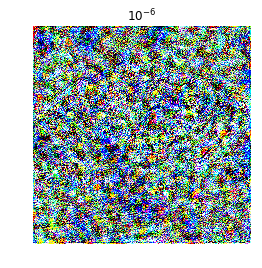

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.135207 Content Loss: 0.022973

run [100]:
Style Loss : 0.013954 Content Loss: 0.021339

run [150]:
Style Loss : 0.004696 Content Loss: 0.017801

run [200]:
Style Loss : 0.010437 Content Loss: 0.015408

run [250]:
Style Loss : 0.001833 Content Loss: 0.013529

run [300]:
Style Loss : 0.001845 Content Loss: 0.012093



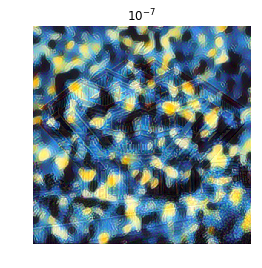

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 1.664868 Content Loss: 0.023399

run [100]:
Style Loss : 0.126972 Content Loss: 0.023680

run [150]:
Style Loss : 0.045665 Content Loss: 0.023651

run [200]:
Style Loss : 0.019724 Content Loss: 0.023233

run [250]:
Style Loss : 0.011136 Content Loss: 0.022569

run [300]:
Style Loss : 0.007045 Content Loss: 0.021466



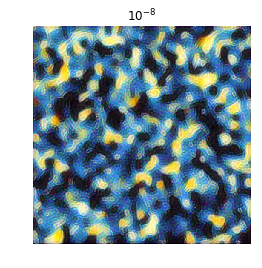

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.000114 Content Loss: 0.000219

run [100]:
Style Loss : 0.000028 Content Loss: 0.000100

run [150]:
Style Loss : 0.000024 Content Loss: 0.000063

run [200]:
Style Loss : 0.000024 Content Loss: 0.000050

run [250]:
Style Loss : 0.000025 Content Loss: 0.000052

run [300]:
Style Loss : 0.000025 Content Loss: 0.000046



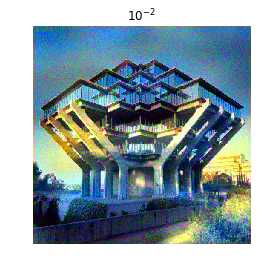

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.000081 Content Loss: 0.000615

run [100]:
Style Loss : 0.000062 Content Loss: 0.000262

run [150]:
Style Loss : 0.000059 Content Loss: 0.000171

run [200]:
Style Loss : 0.000063 Content Loss: 0.000147

run [250]:
Style Loss : 0.000059 Content Loss: 0.000120

run [300]:
Style Loss : 0.000613 Content Loss: 0.000783



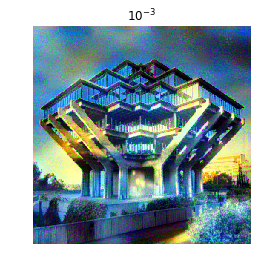

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.000223 Content Loss: 0.001282

run [100]:
Style Loss : 0.000094 Content Loss: 0.000627

run [150]:
Style Loss : 0.000086 Content Loss: 0.000438

run [200]:
Style Loss : 0.000086 Content Loss: 0.000354

run [250]:
Style Loss : 0.000109 Content Loss: 0.000362

run [300]:
Style Loss : 0.000090 Content Loss: 0.000315



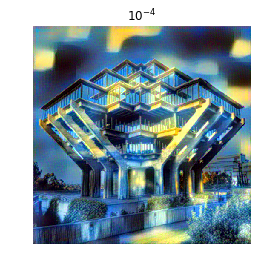

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.001380 Content Loss: 0.002460

run [100]:
Style Loss : 0.000221 Content Loss: 0.001410

run [150]:
Style Loss : 0.000146 Content Loss: 0.001102

run [200]:
Style Loss : 0.000125 Content Loss: 0.000937

run [250]:
Style Loss : 0.000112 Content Loss: 0.000830

run [300]:
Style Loss : 0.000102 Content Loss: 0.000736



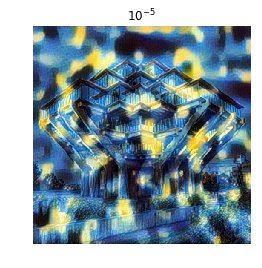

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.015260 Content Loss: 0.003124

run [100]:
Style Loss : 0.001228 Content Loss: 0.002657

run [150]:
Style Loss : 0.000487 Content Loss: 0.002128

run [200]:
Style Loss : 0.000268 Content Loss: 0.001797

run [250]:
Style Loss : 0.000207 Content Loss: 0.001594

run [300]:
Style Loss : 0.000158 Content Loss: 0.001470



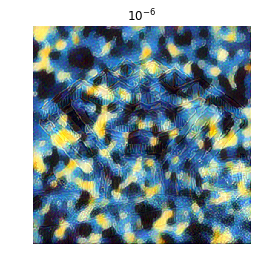

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 0.150714 Content Loss: 0.003199

run [100]:
Style Loss : 0.013281 Content Loss: 0.003180

run [150]:
Style Loss : 0.004112 Content Loss: 0.003035

run [200]:
Style Loss : 0.001884 Content Loss: 0.002853

run [250]:
Style Loss : 0.001051 Content Loss: 0.002669

run [300]:
Style Loss : 0.000641 Content Loss: 0.002476



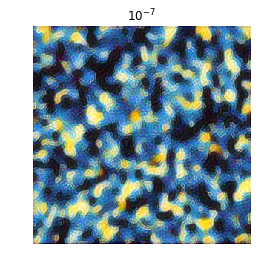

Building the style transfer model..
['conv_5']
Optimizing..
run [50]:
Style Loss : 2.974946 Content Loss: 0.003158

run [100]:
Style Loss : 0.143491 Content Loss: 0.003212

run [150]:
Style Loss : 0.044249 Content Loss: 0.003177

run [200]:
Style Loss : 0.017796 Content Loss: 0.003134

run [250]:
Style Loss : 0.010070 Content Loss: 0.003104

run [300]:
Style Loss : 0.006510 Content Loss: 0.003071



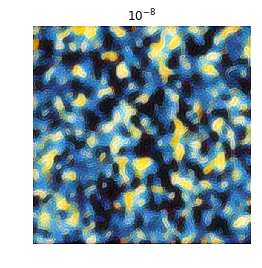

In [0]:
all_images = []
conv = 'conv_'
style_weights=[2, 3, 4, 5, 6, 7, 8]

for l in range(1, 6):
  content_layers_customized = [conv+str(l)]
  images = []
  for style_weight in style_weights:
      input_img = torch.randn(content_img.data.size(), device=device)
      output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                  content_img, style_img, input_img,
                             style_weight=10**style_weight, content_weight=1, content_layers=content_layers_customized)
      images.append(copy.deepcopy(output))
      plt.figure()
      imshow(output, title='$10^{-%d}$'%style_weight)
  all_images.append(images)

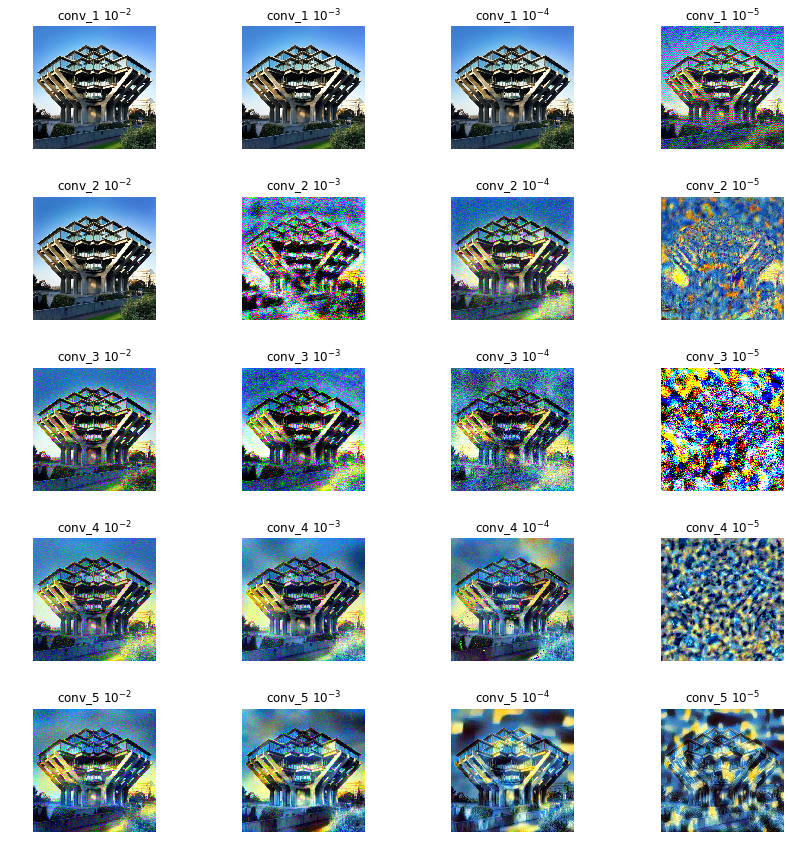

In [0]:
# Show the results
cols = ['$10^{-%d}$'%col for col in range(2, 9)]
rows = ['conv_%d'%col for col in range(1, 6)]

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(12, 12))
    
for idx_r, row in enumerate(all_images):
    for idx_c, col in enumerate(row):
      if idx_c >= 4:
        break
      axes[idx_r,idx_c].clear()
      imshow(col, axes[idx_r,idx_c], title="{} {}".format(rows[idx_r], cols[idx_c]))
    
fig.tight_layout()
plt.show()

## Change different styles

Building the style transfer model..
['conv_4']
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 0.000851 Content Loss: 0.006300

run [100]:
Style Loss : 0.000683 Content Loss: 0.005185

run [150]:
Style Loss : 0.000619 Content Loss: 0.003332

run [200]:
Style Loss : 0.004061 Content Loss: 0.008844

run [250]:
Style Loss : 47.573181 Content Loss: 0.111516

run [300]:
Style Loss : 0.000725 Content Loss: 0.006909

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.000515 Content Loss: 0.004659

run [100]:
Style Loss : 0.000502 Content Loss: 0.001986

run [150]:
Style Loss : 0.000519 Content Loss: 0.001449

run [200]:
Style Loss : 0.000554 Content Loss: 0.001383

run [250]:
Style Loss : 0.000691 Content Loss: 0.001703

run [300]:
Style Loss : 0.000858 Content Loss: 0.002370

Building the style transfer model..
['conv_4']
Optimizing..
run [50]:
Style Loss : 0.000502 Content Loss: 0.002450

run [100]:
Style Loss : 0.000425 Content Loss: 0.001460

run [150]:
Style Loss : 0.000411 Content Loss: 0.001234

run [200]:
Style Loss : 0.0

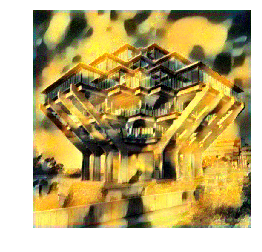

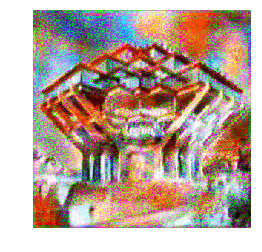

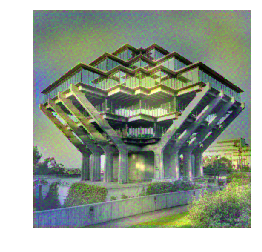

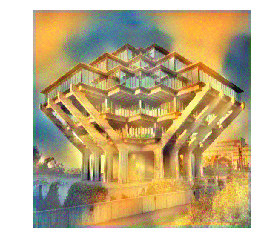

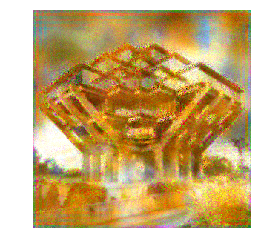

...

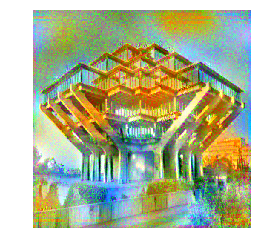

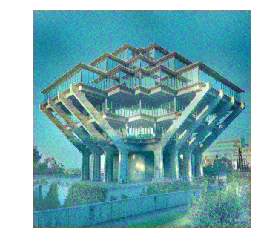

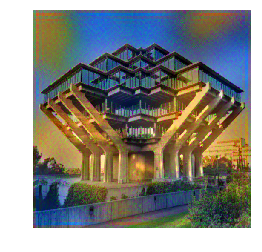

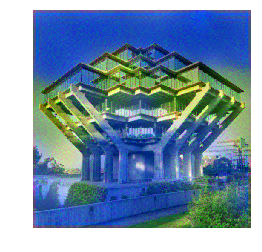

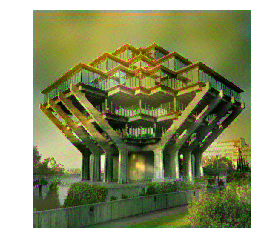

In [139]:
files = []
for idx in range(1,20):
  files.append(str(idx)+'.jpg')

content_layers_customized = ['conv_4']
images_dif_styles = []
imgaes_styles = []
for f in files:
    style_img = image_loader(data_dir+f)
    imgaes_styles.append(copy.deepcopy(style_img))
    
    input_img = torch.randn(content_img.data.size(), device=device)
    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img, input_img,
                           style_weight=10000, content_weight=1, content_layers=content_layers_customized)
    
    images_dif_styles.append(copy.deepcopy(output))
    plt.figure()
    imshow(output)

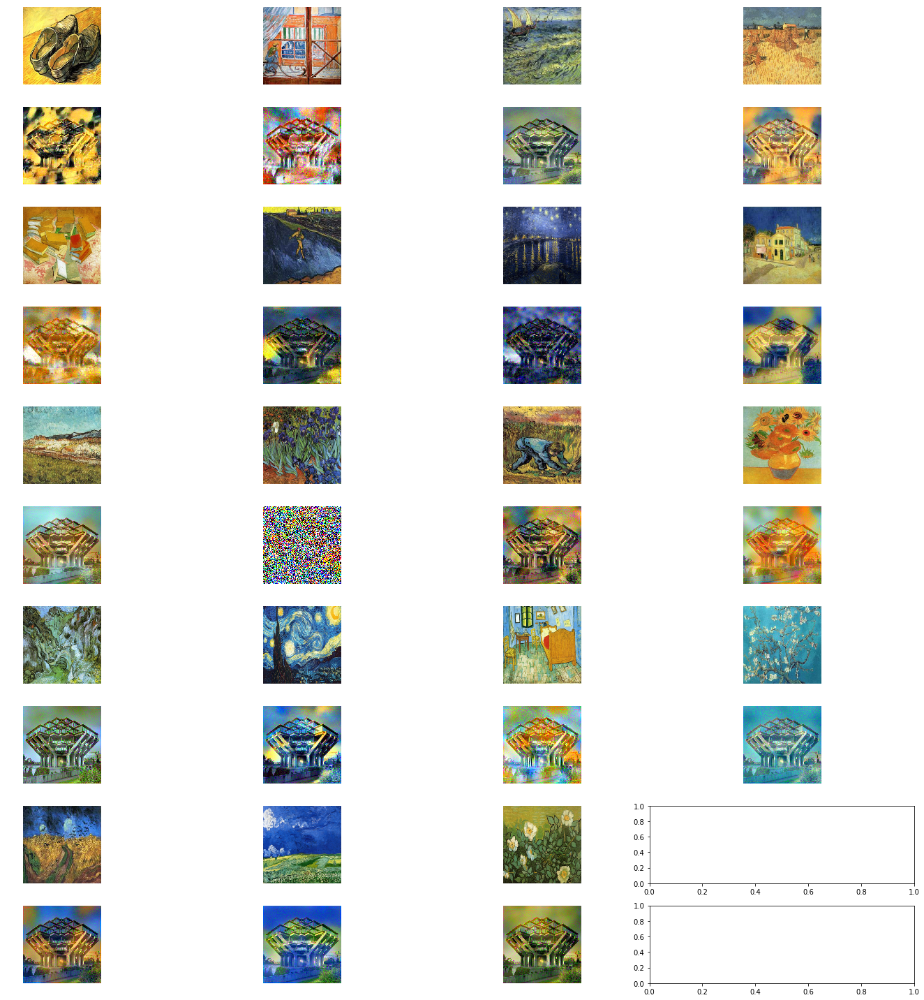

In [141]:
# Show the results
fig, axes = plt.subplots(nrows=2*5, ncols=4, figsize=(20, 20))
    
for idx in range(0,19):
  row = idx//4
  col = idx%4
  
  row_o = row*2
  row_t = row*2 + 1
  
  axes[row_o, col].clear()
  imshow(imgaes_styles[idx], axes[row_o, col])
  
  axes[row_t, col].clear()
  imshow(images_dif_styles[idx], axes[row_t, col])
    
fig.tight_layout()
plt.show()

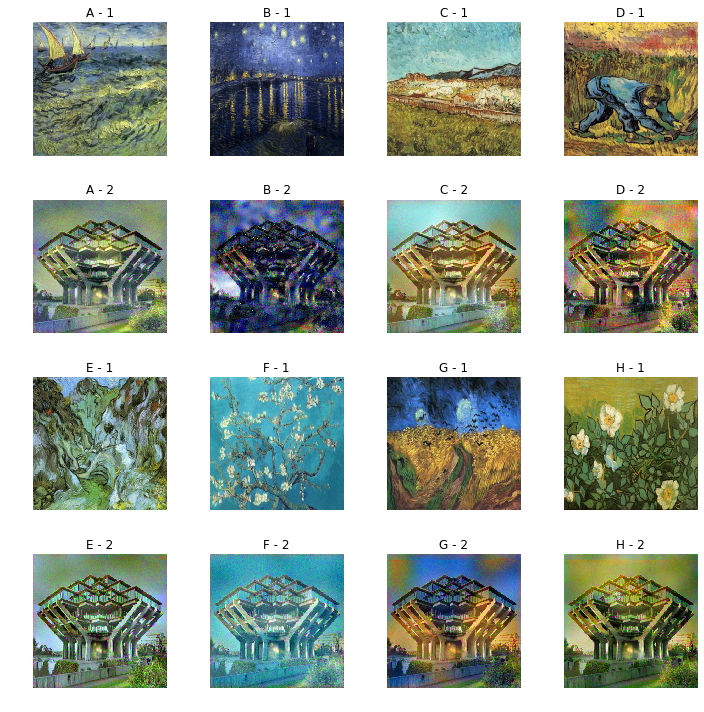

In [177]:
# Show the final results

chosen = [2,6,8,10,12,15,16,18]

fig, axes = plt.subplots(nrows=2*2, ncols=4, figsize=(10, 10))
    
for idx, chose in enumerate(chosen):
  row = idx//4
  col = idx%4
  
  name = chr(ord('A') + idx)

  row_o = row*2
  row_t = row*2 + 1
  
  axes[row_o, col].clear()

  imshow(imgaes_styles[chose], axes[row_o, col])
  axes[row_o, col].set_title(name +' - 1' )
  
  axes[row_t, col].clear()
  imshow(images_dif_styles[chose], axes[row_t, col])
  axes[row_t, col].set_title(name +' - 2')
    
fig.tight_layout()
plt.show()